In [1]:
from skimage import io, color
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

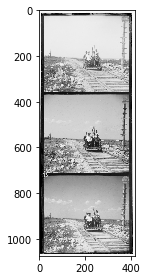

In [2]:
io.imshow(io.imread("public_data/00_input/img.png"));

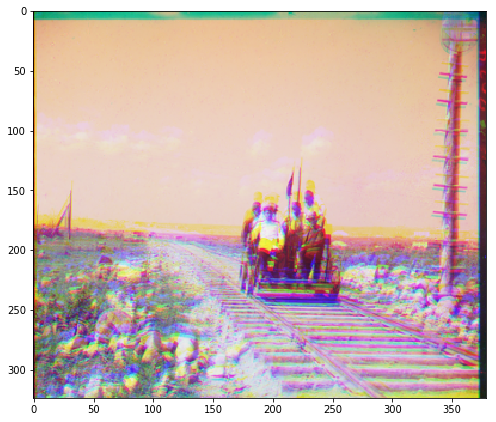

In [3]:
def process_origin(origin):
    height = origin.shape[0]
    # Split into 3 parts
    channels = [origin[: height // 3, :],
                origin[height // 3: height // 3 * 2, :], 
                origin[height // 3 * 2: height // 3 * 3, :]]
    # Remove black lines from borders
    border_h = channels[0].shape[0] // 20
    border_w = channels[0].shape[1] // 20
    channels = [channel[border_h: -border_h, border_w: -border_w] for channel in channels]
    channels = np.array(channels)
    return channels

img = process_origin(io.imread("public_data/00_input/img.png"))
img = np.swapaxes(img, 0, 2)
img = np.swapaxes(img, 0, 1)
plt.figure(figsize=(7,7))
io.imshow(img);

In [4]:
def mse_norm(i1, i2):
    return ((i1 / i1.sum() - i2 / i2.sum()) ** 2).sum() / i1.shape[0] / i1.shape[1]

def mse(i1, i2):
    return ((i1 - i2) ** 2).sum() / i1.shape[0] / i1.shape[1]
        
def corr(i1, i2):
    return - (i1 * i2).sum() / np.sqrt((i1 ** 2).sum() * (i2 ** 2).sum())

In [5]:
def get_cropped_images(shifts, i1, i2):
    x_shift, y_shift = shifts
    if x_shift > 0:
        i1 = i1[x_shift:, :]
    else:
        i2 = i2[-x_shift:, :]
        
    if y_shift > 0:
        i1 = i1[:, y_shift:]
    else:
        i2 = i2[:, -y_shift:]
    
    if i1.shape[0] > i2.shape[0]:
        i1 = i1[:i2.shape[0], :]
    else:
        i2 = i2[:i1.shape[0], :]
    
    if i1.shape[1] > i2.shape[1]:
        i1 = i1[:, :i2.shape[1]]
    else:
        i2 = i2[:, :i1.shape[1]]
        
    return i1, i2

def get_cropped_images3(shifts01, shifts02, shifts12, i0, i1, i2):
    
#     shifts01 -= shifts12 // 2
#     shifts02 += shifts12 // 2
    i0_sh, i1_sh = get_cropped_images(shifts01, i0, i1)
    i2_sh, _ = get_cropped_images(shifts01, i2, i1)
    i2_sh_copy = i2_sh.copy()
    i0_sh, i2_sh = get_cropped_images(shifts02, i0_sh, i2_sh_copy)
    i1_sh, _ = get_cropped_images(shifts02, i1_sh, i2_sh_copy)
    return i0_sh, i1_sh, i2_sh

def find_optimal_shift(i1, i2, metric, ranges):
    optimal_shifts = np.zeros(2).astype(np.uint8)
    optimal_value = 1e6
    for shift_x in range(ranges[0], ranges[1]):
        for shift_y in range(ranges[2], ranges[3]):
            shifts = np.array([shift_x, shift_y]).astype(np.int8)
            i1_cropped, i2_cropped = get_cropped_images(shifts, i1, i2)
            value = metric(i1_cropped, i2_cropped)
            if value < optimal_value:
                optimal_value = value
                optimal_shifts = shifts
    return optimal_shifts, optimal_value

In [6]:
def pyramid(img_big, metric):
    pyramid = [img_big]
    while img_big.shape[1] >= 500 or img_big.shape[2] >= 500:
        img_big = np.array([resize(img_big[i], (img_big[i].shape[0] // 2, img_big[i].shape[1] // 2))
                            for i in range(3)])
        pyramid.append(img_big)
    pyramid = pyramid[::-1]
    
    maxx01 = maxy01 = maxx02 = maxy02 = maxx12 = maxy12 = 15
    minx01 = miny01 = minx02 = miny02 = minx12 = miny12 = -15
    for img in pyramid:
        shifts01, val2 = find_optimal_shift(img[0], img[1], metric, (minx01, maxx01, miny01, maxy01))
        shifts02, val1 = find_optimal_shift(img[0], img[2], metric, (minx02, maxx02, miny02, maxy02))
        shifts12, val0 = find_optimal_shift(img[1], img[2], metric, (minx12, maxx12, miny12, maxy12))
        a = 1
        minx01, maxx01, miny01, maxy01 = 2*shifts01[0]-a, 2*shifts01[0]+a, 2*shifts01[1]-a, 2*shifts01[1]+a
        minx02, maxx02, miny02, maxy02 = 2*shifts02[0]-a, 2*shifts02[0]+a, 2*shifts02[1]-a, 2*shifts02[1]+a
        minx12, maxx12, miny12, maxy12 = 2*shifts12[0]-a, 2*shifts12[0]+a, 2*shifts12[1]-a, 2*shifts12[1]+a
        
    if val1 == max([val0, val1, val2]):
        shifted1, shifted0, shifted2 = get_cropped_images3(-shifts01, shifts12, shifts02, img[1], img[0] , img[2])
    elif val2 == max([val0, val1, val2]):
        shifted2, shifted1, shifted0 = get_cropped_images3(shifts12, -shifts02, shifts01, img[2], img[1], img[0])
    else:
        shifted0, shifted1, shifted2 = get_cropped_images3(shifts01, shifts02, shifts12, img[0], img[1], img[2])
    return np.array([shifted2, shifted1, shifted0]).transpose(1,2,0)
    
def align(img, g_coord, metric=mse):
    return pyramid(process_origin(img), metric)

# Difficult examples

/home/ilivans/.virtualenvs/cmn36/lib/python3.6/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


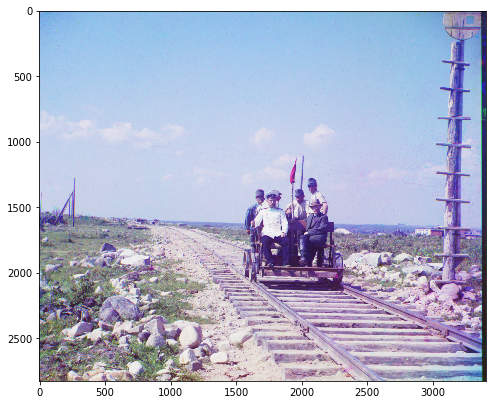

In [7]:
for idx in (10,):
    img = io.imread('./public_data/{}_input/img.png'.format(idx))
    plt.figure(figsize=(7,7))
    io.imshow(align(img, mse_norm)[0])

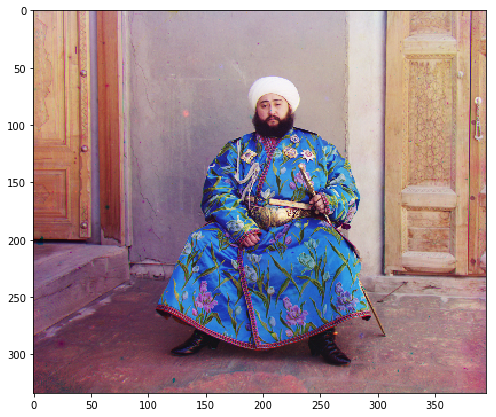

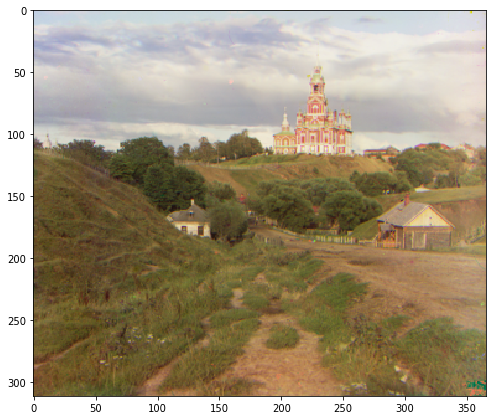

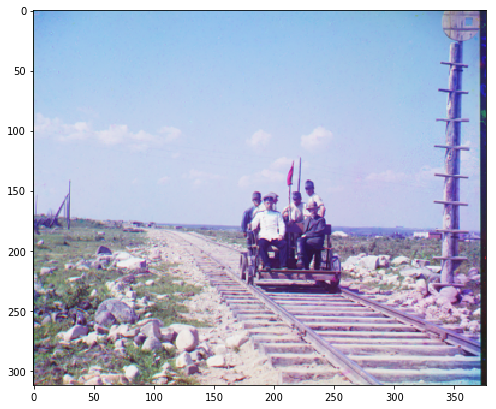

In [220]:
for idx in (9, 2, 0):
    img = io.imread('./public_data/0{}_input/img.png'.format(idx))
    plt.figure(figsize=(7,7))
    io.imshow(align(img, mse_norm))

# All examples

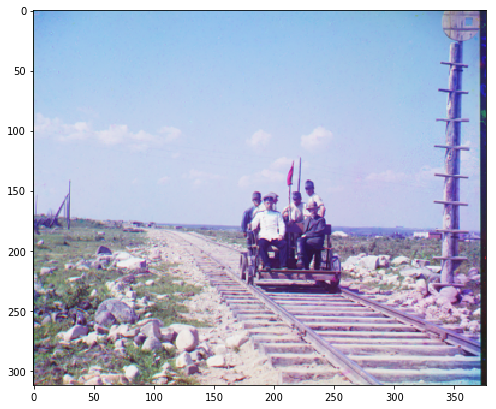

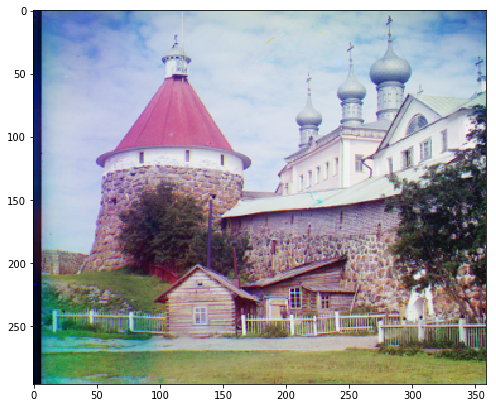

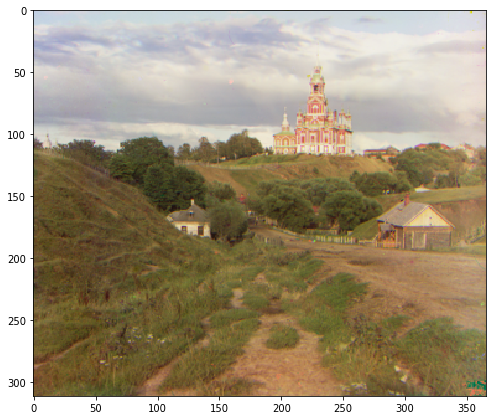

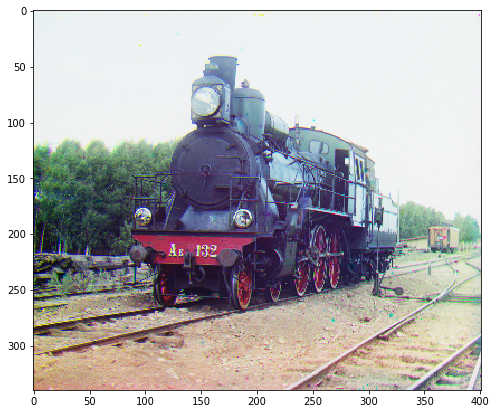

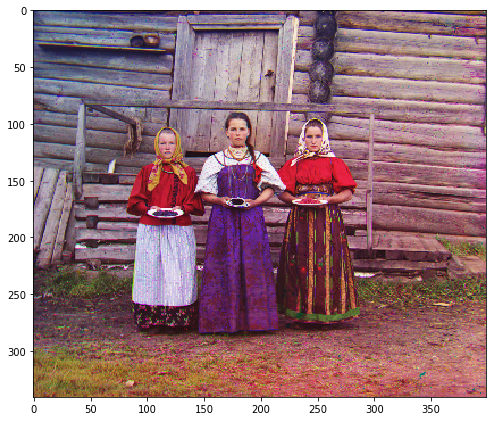

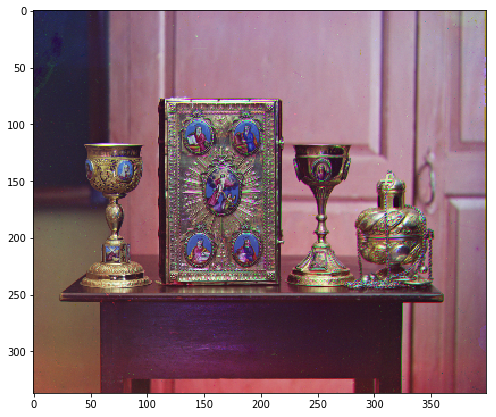

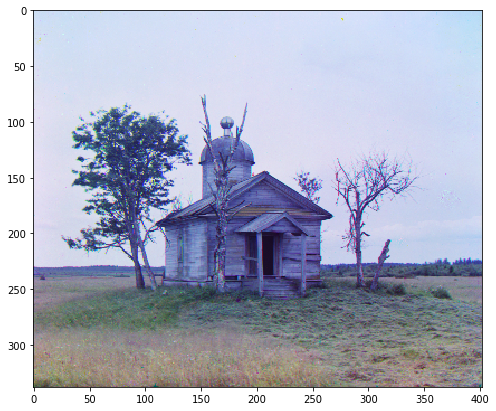

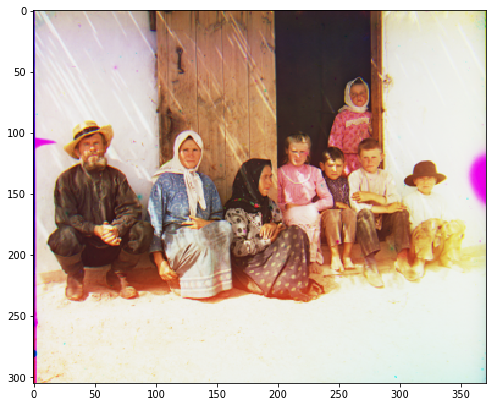

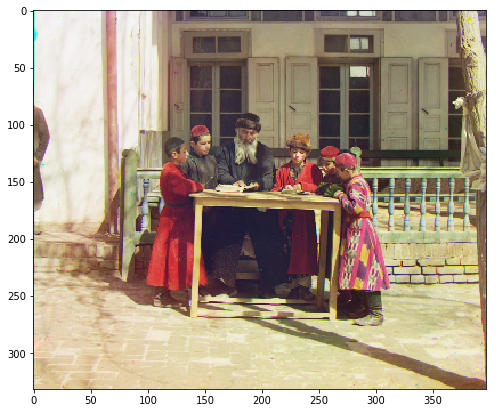

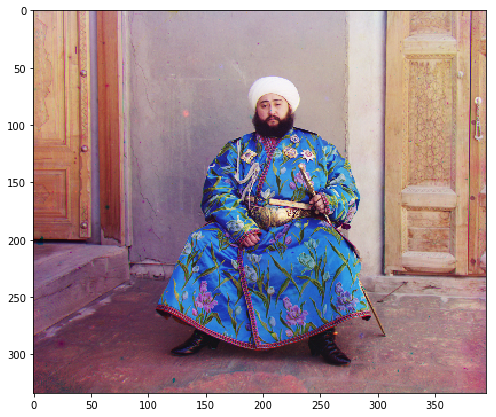

In [8]:
for idx in range(10):
    img = io.imread('./public_data/0{}_input/img.png'.format(idx))
    plt.figure(figsize=(7,7))
    io.imshow(align(img, mse_norm))

/home/ilivans/.virtualenvs/cmn36/lib/python3.6/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


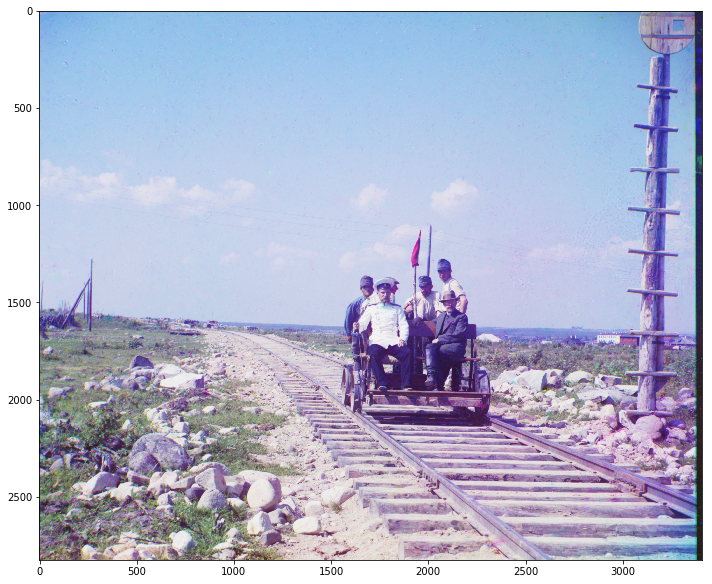

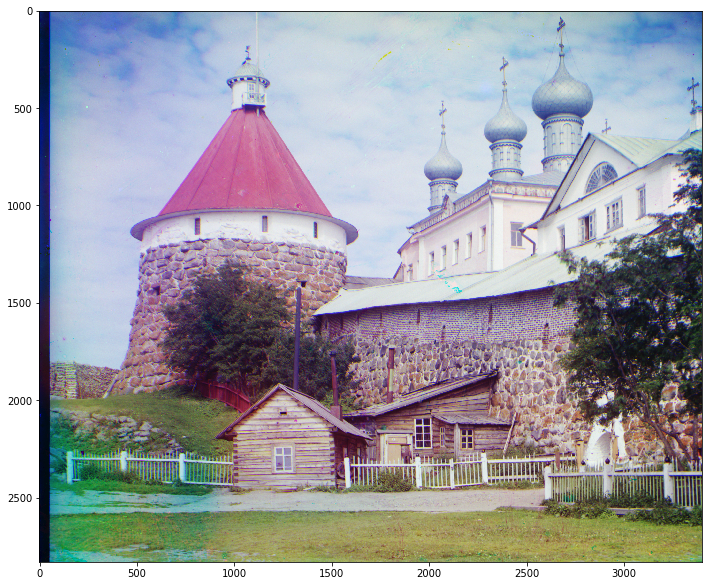

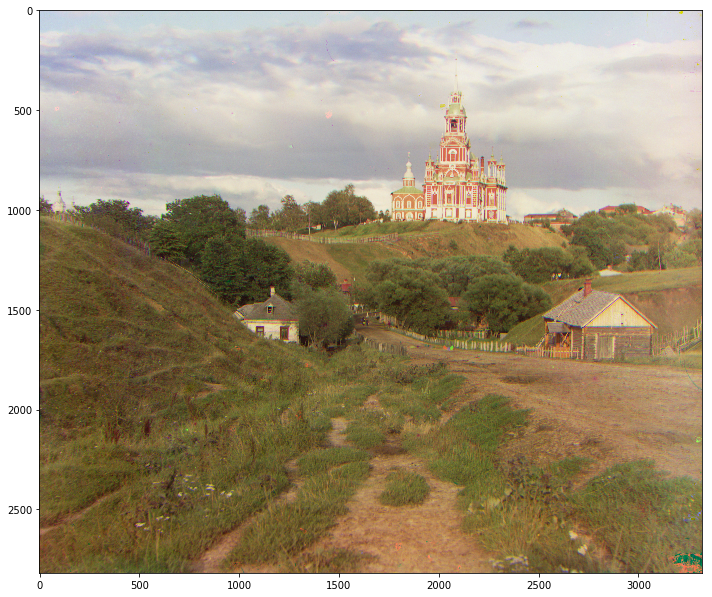

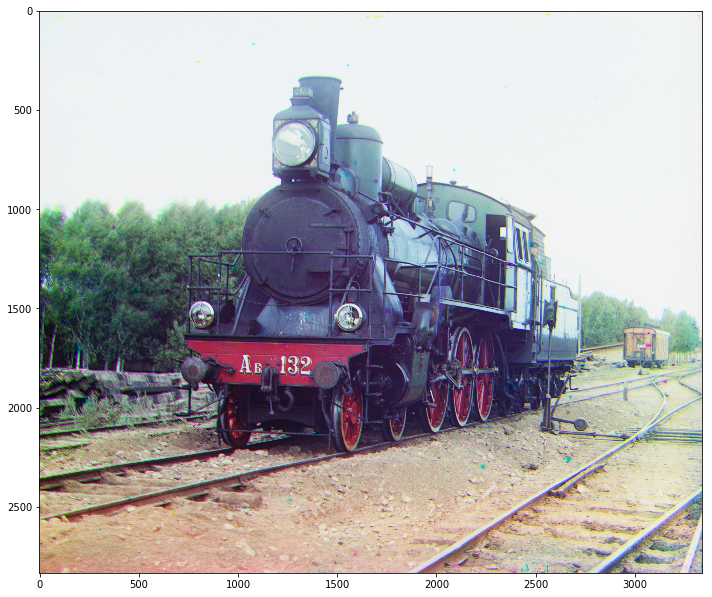

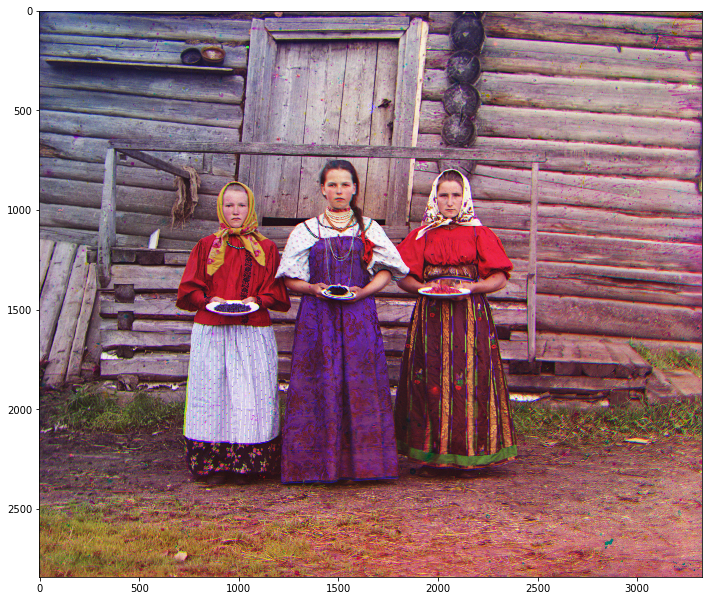

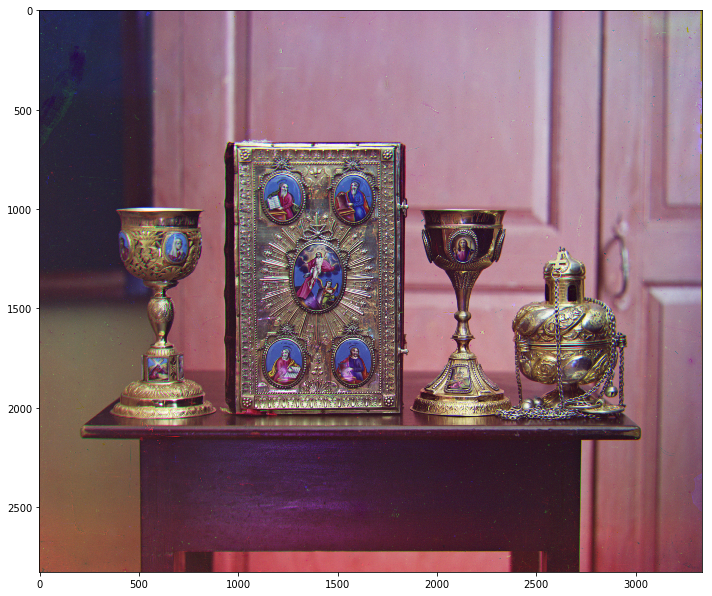

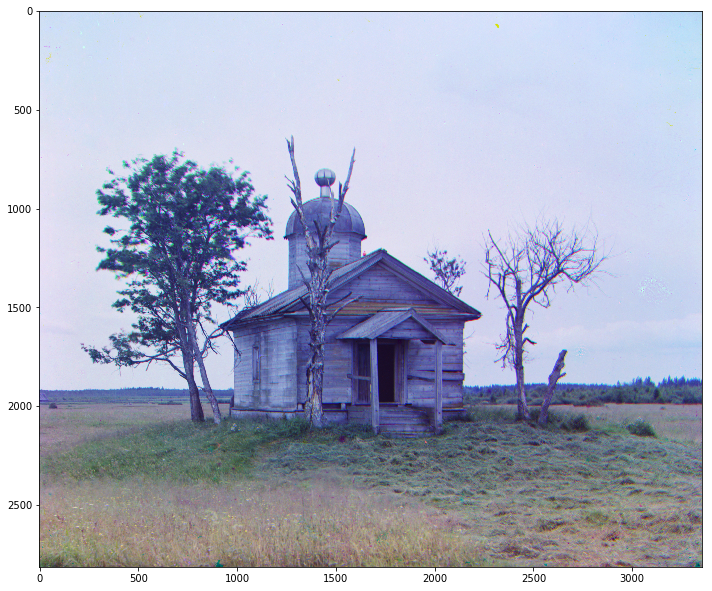

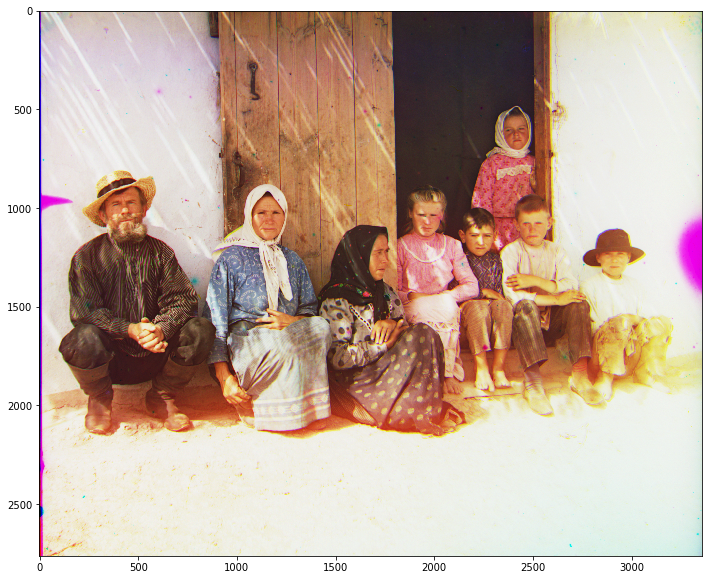

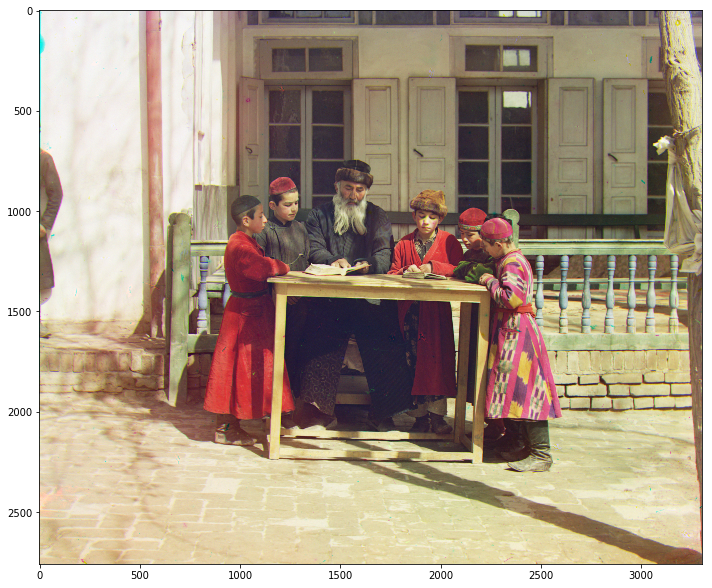

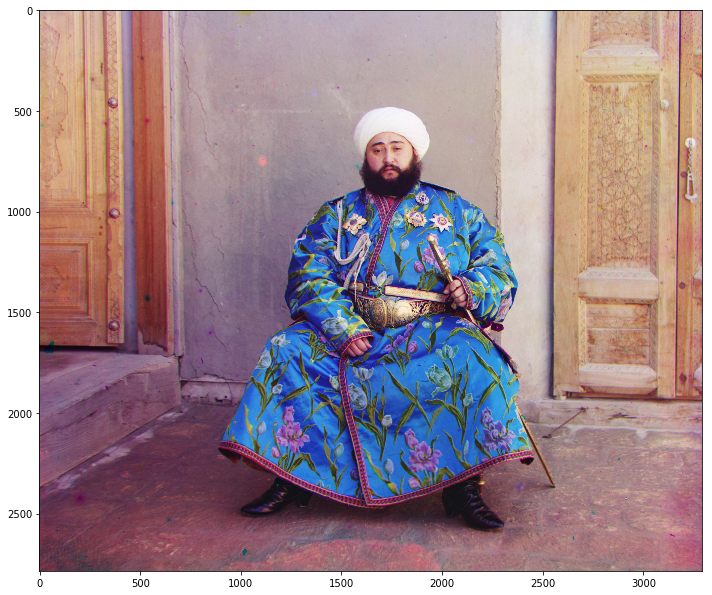

In [9]:
for idx in range(10, 20):
    img = io.imread('./public_data/{}_input/img.png'.format(idx))
    plt.figure(figsize=(10,10))
    io.imshow(align(img, mse_norm))